# Animal MicroRNAs Classification
---
---

In [1]:
import multiprocessing

SEED = 42 # Seed for reproducibility
print('Availables CPU cores: ', multiprocessing.cpu_count())

Availables CPU cores:  8


---
## Data Exploration and Preprocessing

In [2]:
import pandas as pd
import numpy as np

dataset = pd.read_csv('Animal_data.csv', sep=',')

# Get dataset dimensions
matrix = np.matrix(dataset)
print('\n> Animal dataset:', matrix.shape[0], 'samples,', matrix.shape[1], 'features')
print(f"\n- miRNAs samples: {dataset[dataset['type'] == 'miRNA'].shape[0]}")
print(f"- Random samples: {dataset[dataset['type'] == 'rand'].shape[0]}")

dataset


> Animal dataset: 75569 samples, 29 features

- miRNAs samples: 35570
- Random samples: 39999


,mer,type,in_db,mer6,mer7,mer8,gc,gcs,cpg,cwf,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
0,AGTAAATAGTCTGGA,miRNA,5,981,244,61,0.333333,0.600000,0.000000,1.733947,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
1,CAGCACTACATGGTT,miRNA,1,1225,272,89,0.466667,0.142857,0.000000,1.700613,...,0.785714,0.785714,0.785714,0.785714,1.0,0.833333,0.903226,0.930233,0.944444,0.953125
2,TTCCCACCTTCTGAT,miRNA,2,958,185,71,0.466667,0.714286,0.000000,1.747781,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
3,TTGGCACTTGCACAA,miRNA,1,1927,589,177,0.466667,0.142857,0.000000,1.700613,...,0.439560,0.402930,0.402930,0.402930,1.0,0.666667,0.709677,0.767442,0.814815,0.843750
4,ATAATCTGGTATGTG,miRNA,1,1133,330,122,0.333333,0.600000,0.000000,1.733947,...,0.571429,0.571429,0.571429,0.571429,1.0,0.666667,0.806452,0.860465,0.888889,0.906250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75564,TCAAAGGGAACGCGC,rand,0,516,92,35,0.600000,0.111111,0.100000,1.731983,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
75565,CAGATTCGCTCCGAT,rand,0,487,80,11,0.533333,0.250000,0.133333,1.703717,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
75566,CTGAGGGACTGCGCC,rand,0,562,97,13,0.733333,0.090909,0.033333,1.723216,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
75567,CTAAGGGGACTACAA,rand,0,417,67,19,0.466667,0.142857,0.000000,1.714448,...,0.483516,0.483516,0.483516,0.483516,1.0,0.666667,0.741935,0.813953,0.851852,0.875000


### Split data

In [3]:
from sklearn.model_selection import train_test_split

# Split in train and test data
X = dataset.drop(['mer', 'type', 'in_db'], axis=1)
y = dataset['type'].replace(['miRNA','rand'], [1, 0])

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

print(f"> Train data : {X_train_val.shape[0]} samples ( {round((X_train_val.shape[0]/X.shape[0])*100, 2)}% )")
print(f"> Test data  : {X_test.shape[0]} samples ( {round((X_test.shape[0]/X.shape[0])*100, 2)}% )")

> Train data : 60455 samples ( 80.0% )
> Test data  : 15114 samples ( 20.0% )


In [4]:
print("- Class distribution:")
print(f"> Train data : {list(y_train_val.value_counts())[0]} Random, {list(y_train_val.value_counts())[1]} miRNA")
print(f"> Test data  : {list(y_test.value_counts())[0]} Random, {list(y_test.value_counts())[1]} miRNA")

- Class distribution:
> Train data : 32031 Random, 28424 miRNA
> Test data  : 7968 Random, 7146 miRNA


In [5]:
from sklearn.preprocessing import MinMaxScaler

# Data normalization
scaler = MinMaxScaler()

X_train_val_std = X_train_val.copy()
X_test_std = X_test.copy()
cols = list(X.columns)

X_train_val_std[cols] = scaler.fit_transform(X_train_val[cols])
X_test_std[cols] = scaler.transform(X_test[cols])

X_train_val_std # Train data normalized

,mer6,mer7,mer8,gc,gcs,cpg,cwf,ce,cm1,cm2,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
68561,0.145225,0.078974,0.026157,0.533333,0.500000,0.166667,0.103759,0.912724,0.912724,0.658681,...,0.575931,0.584853,0.590131,0.592103,1.0,0.615385,0.714286,0.785714,0.828571,0.853659
109,0.380426,0.307692,0.227364,0.333333,0.200000,0.000000,0.151921,0.860894,0.860894,0.746111,...,0.776504,0.781206,0.783988,0.785027,1.0,0.769231,0.857143,0.892857,0.914286,0.926829
47123,0.180347,0.080000,0.052314,0.466667,0.428571,0.400000,0.089036,0.929517,0.929517,0.682638,...,0.524355,0.488079,0.494587,0.497018,1.0,0.615385,0.666667,0.714286,0.771429,0.804878
62277,0.374507,0.169231,0.018109,0.400000,0.333333,0.250000,0.103759,0.912724,0.912724,0.785626,...,0.713467,0.719495,0.723061,0.724394,1.0,0.769231,0.809524,0.857143,0.885714,0.902439
57974,0.311365,0.229744,0.076459,0.533333,0.500000,0.000000,0.169518,0.863313,0.863313,0.682638,...,0.575931,0.584853,0.590131,0.592103,1.0,0.615385,0.714286,0.785714,0.828571,0.853659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37194,0.147198,0.067692,0.004024,0.333333,0.200000,0.000000,0.089036,0.929517,0.929517,0.722153,...,0.644699,0.652174,0.656596,0.658248,1.0,0.692308,0.761905,0.821429,0.857143,0.878049
6265,0.286898,0.223590,0.152918,0.533333,0.250000,0.000000,0.089036,0.929517,0.929517,0.682638,...,0.575931,0.584853,0.590131,0.592103,1.0,0.615385,0.714286,0.785714,0.828571,0.853659
54886,0.174822,0.112821,0.074447,0.600000,0.111111,0.000000,0.235277,0.857540,0.857540,0.595209,...,0.415473,0.352969,0.327627,0.330861,1.0,0.538462,0.571429,0.607143,0.657143,0.707317
860,0.122731,0.099487,0.078471,0.800000,0.666667,0.000000,0.565759,0.510696,0.510696,0.249392,...,0.232092,0.203366,0.213494,0.217278,1.0,0.384615,0.380952,0.464286,0.571429,0.634146


In [6]:
X_train_val # Train data no normalized

,mer6,mer7,mer8,gc,gcs,cpg,cwf,ce,cm1,cm2,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
68561,479,77,13,0.533333,0.500000,0.083333,1.714448,1.889246,0.944623,0.759787,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
109,1075,300,113,0.333333,0.200000,0.000000,1.720869,1.829473,0.914737,0.808982,...,0.785714,0.785714,0.785714,0.785714,1.0,0.833333,0.903226,0.930233,0.944444,0.953125
47123,568,78,26,0.466667,0.428571,0.200000,1.712485,1.908613,0.954306,0.773267,...,0.543956,0.498626,0.498626,0.498626,1.0,0.722222,0.774194,0.813953,0.851852,0.875000
62277,1060,165,9,0.400000,0.333333,0.125000,1.714448,1.889246,0.944623,0.831216,...,0.725275,0.725275,0.725275,0.725275,1.0,0.833333,0.870968,0.906977,0.925926,0.937500
57974,900,224,38,0.533333,0.500000,0.000000,1.723216,1.832263,0.916131,0.773267,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37194,484,66,2,0.333333,0.200000,0.000000,1.712485,1.908613,0.954306,0.795501,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
6265,838,218,76,0.533333,0.250000,0.000000,1.712485,1.908613,0.954306,0.773267,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
54886,554,110,37,0.600000,0.111111,0.000000,1.731983,1.825605,0.912803,0.724073,...,0.439560,0.366300,0.333000,0.333000,1.0,0.666667,0.709677,0.744186,0.777778,0.812500
860,422,97,39,0.800000,0.666667,0.000000,1.776048,1.425605,0.712803,0.529491,...,0.263736,0.219780,0.219780,0.219780,1.0,0.555556,0.580645,0.651163,0.722222,0.765625


### KFold for CV

In [6]:
from sklearn.model_selection import KFold

# KFold
splits = 5
k_fold = KFold(n_splits=splits, shuffle=True, random_state=SEED)

# Get train and validation folds for cross-validation
index = 0
X_train, X_val, y_train, y_val = [0]*5, [0]*5, [0]*5, [0]*5
X_train_std, X_val_std, y_train_std, y_val_std = [0]*5, [0]*5, [0]*5, [0]*5

print("\n> Kfold indexes for train and validation data:\n")
for train_index, val_index in k_fold.split(X_train_val):
  print("TRAIN:", train_index, "VAL:", val_index)
  # Non normalized data
  X_train[index], X_val[index] = X_train_val.iloc[train_index], X_train_val.iloc[val_index]
  y_train[index], y_val[index] = y_train_val.iloc[train_index], y_train_val.iloc[val_index]
  # Normalized data
  X_train_std[index], X_val_std[index] = X_train_val_std.iloc[train_index], X_train_val_std.iloc[val_index]
  y_train_std[index], y_val_std[index] = y_train_val.iloc[train_index], y_train_val.iloc[val_index]
  index+=1


> Kfold indexes for train and validation data:

TRAIN: [    0     1     2 ... 60452 60453 60454] VAL: [    4     6     7 ... 60431 60434 60444]
TRAIN: [    2     3     4 ... 60452 60453 60454] VAL: [    0     1    11 ... 60438 60439 60441]
TRAIN: [    0     1     2 ... 60449 60451 60454] VAL: [    3     8    14 ... 60450 60452 60453]
TRAIN: [    0     1     2 ... 60452 60453 60454] VAL: [    5    15    18 ... 60447 60448 60449]
TRAIN: [    0     1     3 ... 60450 60452 60453] VAL: [    2     9    10 ... 60436 60451 60454]


In [7]:
print("--- Class distribution ---")
for i in range(splits):
    print(f"\n- Split {i+1}:")
    print(f"> Train data : {list(y_train[i].value_counts())[0]} Random, {list(y_train[i].value_counts())[1]} miRNA")
    print(f"> Val data   : {list(y_val[i].value_counts())[0]} Random, {list(y_val[i].value_counts())[1]} miRNA")

--- Class distribution ---

- Split 1:
> Train data : 25685 Random, 22679 miRNA
> Val data   : 6346 Random, 5745 miRNA

- Split 2:
> Train data : 25542 Random, 22822 miRNA
> Val data   : 6489 Random, 5602 miRNA

- Split 3:
> Train data : 25629 Random, 22735 miRNA
> Val data   : 6402 Random, 5689 miRNA

- Split 4:
> Train data : 25627 Random, 22737 miRNA
> Val data   : 6404 Random, 5687 miRNA

- Split 5:
> Train data : 25641 Random, 22723 miRNA
> Val data   : 6390 Random, 5701 miRNA


All data splits have balanced classes

---
## Data Distribution Visualization

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

# Divide data by classes
miRNA_data = X[(dataset['type'] == 'miRNA')]
rand_data = X[(dataset['type'] == 'rand')]

# Histograms of features distribution
k = 1
fig = plt.figure(figsize=(20,64), dpi=300)
plt.subplots_adjust(hspace=0.5)
fig.suptitle('Animal Data Distribution', fontsize=20, y=0.9)

for col in X.columns[0:26]:
  plt.subplot(13,2,k)
  limits = [min(X[col]), max(X[col])]
  sns.histplot(rand_data[col], bins=20, binrange=limits, kde=True, color="salmon")
  sns.histplot(miRNA_data[col], bins=20, binrange=limits, kde=True, color="#86bf91")
  plt.title(col.capitalize(), fontsize=16)
  plt.xlabel("Values")
  plt.ylabel("Frequency")
  plt.legend(labels=['Random','miRNA'])
  k+=1

---
## Tools

Run the RFEH method (Recursive Feature Elimination with Grid Search for hyperparams tuning) with cross validation

In [8]:
from RFEH import RFEH

def rfeh_cv(X_train, X_val, estimator, params_grid, save_path, n_reload = None, split_reload = 0):
    """
    Run the RFEH with cross-validation, using predefined splits with K-fold.

    Can be reloaded from a specific split and number of features.
    """
    rfeh = [0]*splits

    for i in range(split_reload, splits):
        rfeh[i] = RFEH(
                        train_data  = [X_train[i], y_train[i]],
                        val_data    = [X_val[i], y_val[i]],
                        model       = estimator,
                        params_grid = params_grid,
                        metrics     = 'f1',
                        rank_score  = 'gini',
                        seed        = SEED
                        )
        print(f'\nSplit {i+1}:')
        best_result = rfeh[i].run(n_reload=n_reload, save_temp=True, save_path=f"{save_path}/split_{i}")
        print(f"=== Best Results ==={'='*80}\n",
              f"> No. Features: {best_result['n_features']}\n",
              f"> F1 Score: {best_result['score']}\n",
              f"> Hyperparameters: {best_result['hyperparams']}\n{'='*100}"
              )
        # Save results
        rfeh[i].full_results_.to_csv(f"{save_path}/split_{i}/results.csv")
        
        feat_import = rfeh[i].feature_importances_
        features_df = pd.DataFrame({'feature': feat_import.keys(), 'importance': feat_import.values()})
        features_df = features_df.sort_values('importance', ascending = False).reset_index(drop=True)
        features_df.to_csv(f'{save_path}/split_{i}/feature_importances.csv')
        
        n_reload = None

    return rfeh

Methods to summary and save the RFEH results

In [9]:
def save_splits_results(rfeh, save_path):
    """ 
    Save the RFEH results summary of every split in cross-validation.
    """
    splits_results = pd.DataFrame(rfeh[0].results_summary_).drop(['hyperparams', 'score'], axis=1)

    for i in range(splits):
        splits_results[f"params_split_{i}"] = rfeh[i].results_summary_['hyperparams']
        splits_results[f"score_split_{i}"] = rfeh[i].results_summary_['score']

    splits_results['mean_scores'] = splits_results.filter(regex = '(score*)').mean(axis=1)
    splits_results['std_scores'] = splits_results.filter(regex = '(score*)').std(axis=1)
    splits_results.to_csv(f'{save_path}/splits_results_summary.csv', index=False)
    return splits_results

In [10]:
def best_results_cv(save_path, colors = ['slateblue', 'salmon']):
    """
    Get a Dataframe with the best configuration of every split in cross-validation.
    """
    best_results = pd.DataFrame()

    for i in range(splits):
        split = pd.read_csv(f'{save_path}/split_{i}/results.csv')
        split = split.sort_values('mean_test_score', ascending = False)
        split = split.reset_index(drop=True).head(1)
        split['data'] = f'Split {i+1}'
        best_results = pd.concat([best_results, split])

    # Simplify columns names and remove innecesary information
    best_results.columns = [col.replace(f'param_', '') for col in best_results.columns]
    best_results.columns = [col.replace(f'mean_', '') for col in best_results.columns]
    best_results = best_results.drop(['params', 'std_fit_time', 'std_score_time', 'rank_test_score', 
                                      'split0_test_score', 'std_test_score'], axis=1)
    # Reorder the columns
    reoder = ['fit_time', 'score_time']
    best_results = best_results[[col for col in best_results.columns if col not in reoder] + reoder]
    best_results['n_features'] = best_results['n_features'].round()
    best_results = best_results.set_index('data')
    return best_results.style.highlight_max(['fit_time', 'score_time'], color=colors[0], axis=0)\
                             .highlight_min(['test_score'], color=colors[0], axis=0)\
                             .highlight_max(['test_score'], color=colors[1], axis=0)\
                             .highlight_min(['fit_time', 'score_time'], color=colors[1], axis=0)\
                             .format({'n_features': '{:,.0f}'.format})

Methods to visualize the feature selection curves

In [11]:
def plot_rfeh_results(results, ax, title, std = False, score_metric = 'F1', 
                      colors = ['slateblue', 'salmon'], y_lims = [0, 1]):
    ''' 
    Plot the score results of every set of features.
    '''
    scores = results['score']
    n_features = results['n_features']
    
    if std: std_scores = results['std_scores']
    else: std_scores = 0

    ax.fill_between(results['n_features'], 
                    scores-std_scores, 
                    scores+std_scores, 
                    color=colors[0],
                    alpha=0.3
                    )
    ax.plot(n_features, scores, color=colors[0])
    ax.scatter(n_features, scores, color=colors[0])
    ax.scatter([n_features.iloc[scores.idxmax()]], [max(scores)], s=200, facecolors='none', color=colors[1])
    ax.plot([n_features.iloc[scores.idxmax()]]*2, [y_lims[0], max(scores)-0.001], linestyle='--', color=colors[1])
    ax.set_title(title, fontsize=14)
    ax.set_ylabel(f"{score_metric.capitalize()} Score")
    ax.set_xlabel("Number of Features")
    ax.set_ylim(y_lims)
    return None

In [12]:
def plot_rfeh_splits(splits_results, model_name, colors = ['slateblue', 'salmon'], y_lims = [0, 1]):
    """
    Plot the results of all splits and mean results.
    """
    fig, ax = plt.subplots(2, 3, figsize=(18, 8), dpi=300)
    fig.suptitle(f"Feature Selection for {model_name}", fontsize= 20)
    for i in range(splits):
        split_result = splits_results[['n_features', f'score_split_{i}']]
        split_result.columns = ['n_features', 'score']
        axes = [0,i] if i < 3 else [1, i-3]
        plot_rfeh_results(split_result, ax[axes[0], axes[1]], f"Split {i+1}", colors=colors, y_lims=y_lims)

    split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
    split_result.columns = ['n_features', 'score', 'std_scores']
    plot_rfeh_results(split_result, ax[1, 2], f"Mean Scores", std=True, colors=colors, y_lims=y_lims)
    fig.tight_layout()
    return None

Method to evaluate classifiers in test data

In [13]:
import sklearn.metrics as metrics
from time import time

def estimator_evaluation(estimator, train_data, test_data, n_features, save_path, model_name):
    """
    Evaluate a classifier model and get relevance metrics.
    """
    # Get selected features
    features_importances = pd.read_csv(f'{save_path}/feature_importances.csv')
    features = list(features_importances['feature'])[::-1][26-n_features:]

    X_train, y_train = train_data
    X_test, y_test = test_data

    # Fit classifier
    train_init = time()
    estimator.fit(X_train[features].values, y_train)
    train_end = time()

    # Make predictions
    test_init = time()
    prediction = estimator.predict(X_test[features].values)
    test_end = time()

    # Evaluate and get results
    evaluation = {
                  "Accuracy"   : metrics.accuracy_score(y_test, prediction),
                  "Precision"  : metrics.precision_score(y_test, prediction),
                  "Recall"     : metrics.recall_score(y_test, prediction),
                  "F1 Score"   : metrics.f1_score(y_test, prediction),
                  "Train Time" : train_end - train_init,
                  "Test Time"  : test_end - test_init,
                 }

    evaluation_report = pd.DataFrame(evaluation, index = [model_name])

    # Confusion Matrix
    cm = metrics.confusion_matrix(y_test, prediction, labels=[1, 0])
    cm_disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['miRNA', 'rand'])
    return evaluation_report, cm_disp, prediction

---
# 1. Random Forest

## 1.1. Features and hyperparameters selection

In [15]:
from sklearn.ensemble import RandomForestClassifier

# Classifier
estimator = RandomForestClassifier(random_state = SEED)

# Hyperparameters to evaluate
params_grid = {'n_estimators': [100, 200, 400, 600, 800, 1000],
               'criterion'   : ['gini', 'entropy']
              }
# Colors to classifier results
colors = ['#5EBD2A', 'salmon']

#### Non-normalized data

In [16]:
%%time
save_path = f'AnimalData/RandomForest'

# Search best configurations
rf_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 20
 > F1 Score: 0.901087781431824
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 19
 > F1 Score: 0.8935807934616039
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 18
 > F1 Score: 0.8963476496449104
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 100}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 20
 > F1 Score: 0.8978244307119275
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 200}

Split 5:
=== Best Results =================================================================

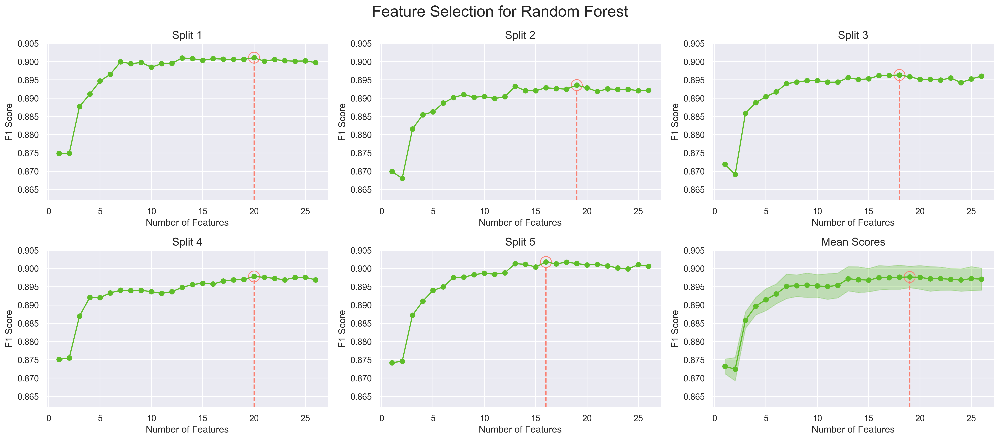

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/RandomForest'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.862, 0.905], colors=colors])

#### On Normalized data

In [19]:
%%time
save_path = f'AnimalData/RandomForest/Normalized'

# Search best configurations
rf_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 13
 > F1 Score: 0.9010043041606887
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 800}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 19
 > F1 Score: 0.8932038834951457
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 18
 > F1 Score: 0.8964584565970756
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 100}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 24
 > F1 Score: 0.8976869829478304
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 800}

Split 5:
=== Best Results ===========================================================

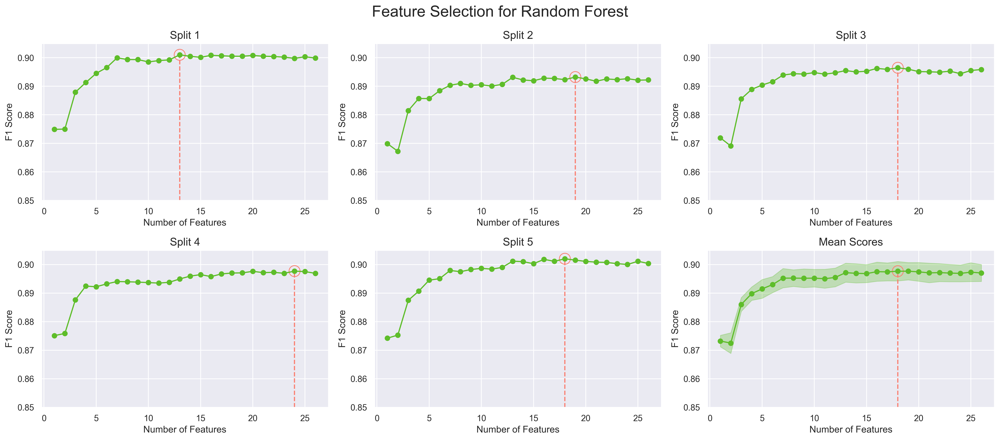

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/RandomForest/Normalized'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.85, 0.905], colors=colors)

### Non-Normalized vs Normalized data

,n_features,criterion,n_estimators,test_score,fit_time,score_time,n_features (n),criterion (n),n_estimators (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,,,,,
Split 1,20,gini,1000,0.901088,50.555950,1.498000,13,entropy,800,0.901004,38.708298,1.109003
Split 2,19,entropy,1000,0.893581,51.969564,1.410597,19,entropy,1000,0.893204,52.470421,1.389384
Split 3,18,gini,100,0.896348,6.576996,0.212001,18,gini,100,0.896458,6.150533,0.196031
Split 4,20,gini,200,0.897824,12.536556,0.390393,24,entropy,800,0.897687,42.705313,1.202518
Split 5,16,gini,800,0.901771,41.595174,1.199000,18,entropy,800,0.902007,42.672452,1.122000


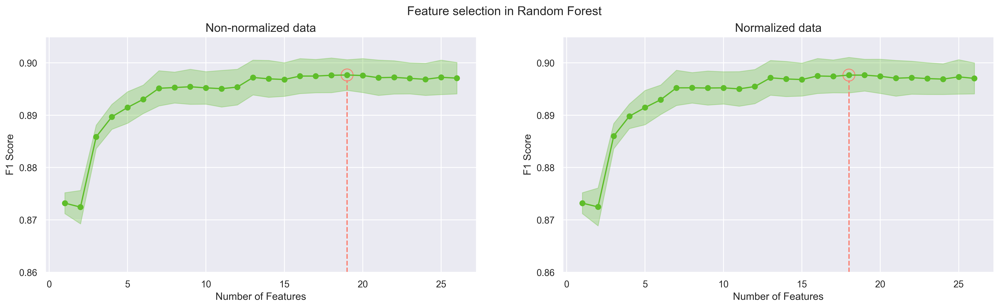

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/RandomForest'
colors = ['#5EBD2A', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Random Forest")
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[0.86, 0.905], colors=colors)
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[0.86, 0.905], colors=colors)

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]

compare_Results = pd.concat([results, std_results], axis=1)
compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[0], axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color=colors[0], axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color=colors[1], axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[1], axis=0)

The number of features on non-normalized data is 19, and in normalized data is 18, are very close.

For a better decision about parameters, the performance in each number of estimators is graphed below.

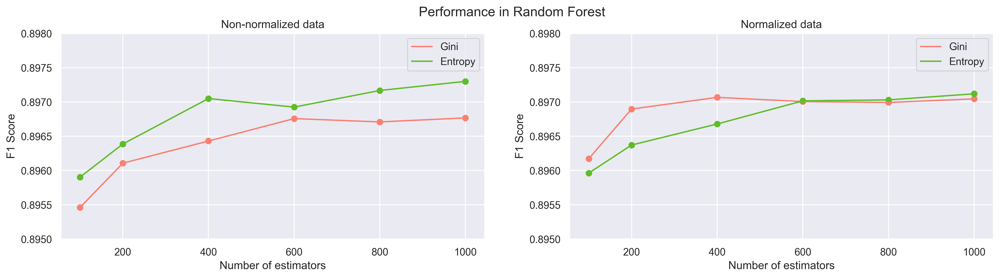

In [18]:
# Compare number of estimators in best number of features
n_features = [19, 18]
save_path = f'AnimalData/RandomForest'
colors = ['#5EBD2A', 'salmon']

scores_gini, scores_gini_std = [], []
scores_entropy, scores_entropy_std = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features[0]}_features.csv")
    df_std = pd.read_csv(f"{save_path}/Normalized/split_{i}/{n_features[1]}_features.csv")
    
    scores_gini.append(df[df['param_criterion'] == 'gini']['mean_test_score'])
    scores_entropy.append(df[df['param_criterion'] == 'entropy']['mean_test_score'])

    scores_gini_std.append(df_std[df_std['param_criterion'] == 'gini']['mean_test_score'])
    scores_entropy_std.append(df_std[df_std['param_criterion'] == 'entropy']['mean_test_score'])

    n_estimators = df[df['param_criterion'] == 'gini']['param_n_estimators']

# Plot the comparation
scores = [[scores_gini, scores_entropy], [scores_gini_std, scores_entropy_std]]
fig, ax = plt.subplots(1, 2, figsize=(18,4), dpi=300)
fig.suptitle("Performance in Random Forest")
for i in range(2):
    ax[i].set_title("Non-normalized data" if i == 0 else "Normalized data")
    ax[i].plot(n_estimators, np.mean(scores[i][0], axis=0), color=colors[1], label="Gini")
    ax[i].scatter(n_estimators, np.mean(scores[i][0], axis=0), color=colors[1])
    ax[i].plot(n_estimators, np.mean(scores[i][1], axis=0), color=colors[0], label="Entropy")
    ax[i].scatter(n_estimators, np.mean(scores[i][1], axis=0), color=colors[0])
    ax[i].set_ylabel("F1 Score")
    ax[i].set_xlabel("Number of estimators")
    ax[i].set_ylim([0.895, 0.898])
    ax[i].legend()

Entropy is getting better results, and non-normalized data seems that have better results than normalized data. In both cases, the best result is obtained with 1000 estimators.

## 1.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Random Forest (Non-normalized data),0.897711,0.862882,0.931710,0.895976,93.725556,3.051289
Random Forest (Normalized data),0.897909,0.863312,0.931570,0.896143,93.929405,2.921395


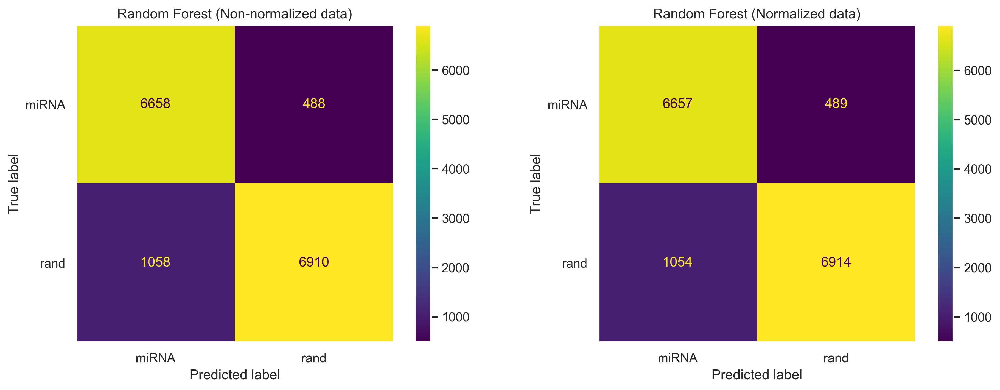

In [20]:
from sklearn.ensemble import RandomForestClassifier

save_path = f'AnimalData/RandomForest/split_0'
colors = ['#5EBD2A', 'salmon']

# Best classifier
n_features = [19, 18]
best_estimator = RandomForestClassifier(n_estimators=1000, criterion='entropy', random_state = SEED)

report, conf_matrix = [0]*2, [0]*2
# Evaluate on no normalized data
report[0], conf_matrix[0], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val, y_train_val], 
                                test_data  = [X_test, y_test],
                                n_features = n_features[0],
                                save_path  = save_path,
                                model_name = "Random Forest (Non-normalized data)"
                            )
# Evaluate on normalized data
report[1], conf_matrix[1], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val_std, y_train_val], 
                                test_data  = [X_test_std, y_test],
                                n_features = n_features[1],
                                save_path  = save_path,
                                model_name = "Random Forest (Normalized data)"
                            )
# Plot confusion matrix
fig, ax = plt.subplots(1, 2, figsize=(15,5), dpi=300)
ax[0].set_title("Random Forest (Non-normalized data)")
ax[1].set_title("Random Forest (Normalized data)")
conf_matrix[0].plot(ax=ax[0])
conf_matrix[1].plot(ax=ax[1])
ax[0].grid(False)
ax[1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color=colors[0], axis=0)

With new data (test data) the model in normalized data have better performance, so we can use it without worry about loss a posible better result with non-normalized data.

---
# 2. Support Vector Machines

### 2.1. Features and hyperparameters selection

In [14]:
from sklearn.svm import SVC

# Classifier
estimator = SVC(random_state=SEED)

# Hyperparameters to evaluate
params_grid = {'C'      : [1, 10, 100],
               'gamma'  : [0.01, 0.1, 1],
               'kernel' : ['linear', 'rbf']
              }
# Colors to classifier results
colors = ['#F3A230', 'salmon']

In [15]:
%%time
save_path = f'AnimalData/SVM'

# Search best configurations
svm_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
svm_splits_results = save_splits_results(svm_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.9012178619756428
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 14
 > F1 Score: 0.8937741519965651
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 13
 > F1 Score: 0.8971709300355751
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 23
 > F1 Score: 0.8985334242837654
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 5:
=== Best Results ==================================================================================

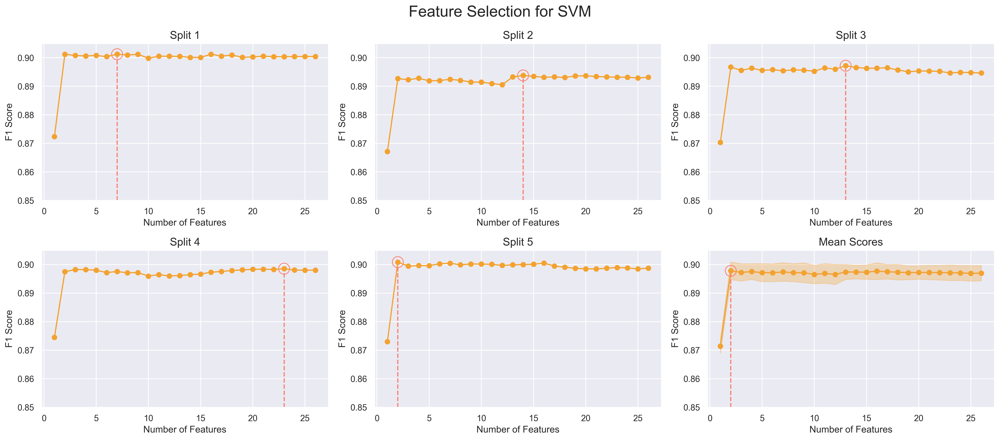

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/SVM'
svm_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(svm_splits_results, "SVM", y_lims=[0.85, 0.905], colors=colors)

### Selection results summary

,n_features,C,gamma,kernel,test_score,fit_time,score_time
data,,,,,,,
Split 1,7,100,1.000000,rbf,0.901218,28.342127,7.218870
Split 2,14,100,1.000000,rbf,0.893774,48.093022,7.493951
Split 3,13,100,1.000000,rbf,0.897171,46.716619,7.361406
Split 4,23,100,1.000000,rbf,0.898533,74.182923,8.150549
Split 5,2,100,1.000000,rbf,0.900831,19.137224,7.596584


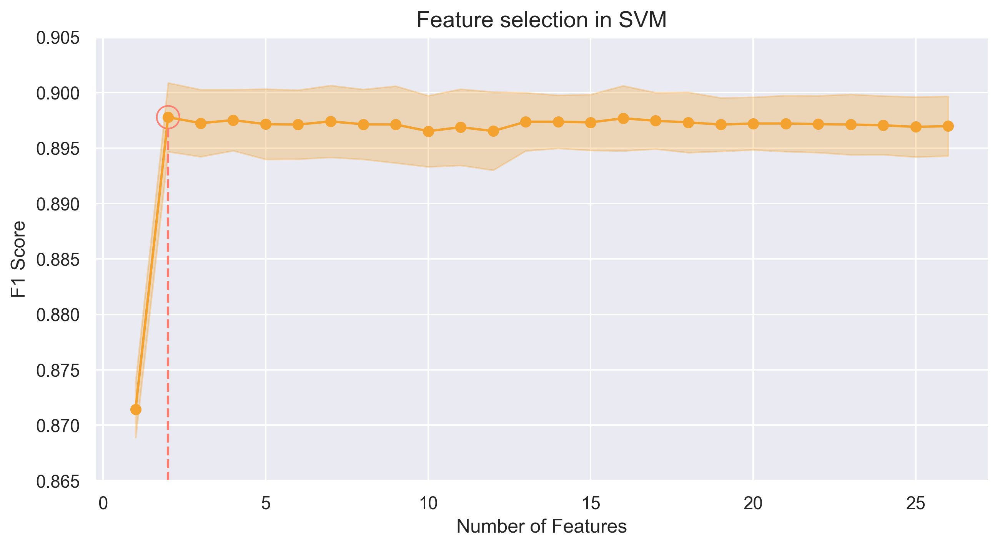

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/SVM'
colors = ['#F3A230', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in SVM", std=True, y_lims=[0.865, 0.905], colors=colors)

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path, colors=colors)

It's looks like with 2 features got the best results, but maybe is not really enough for an SVM classifier.

In [23]:
splits_results = pd.read_csv('AnimalData/SVM/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']
split_result.sort_values(by='score', ascending=False).reset_index(drop=True).head(5)

,n_features,score,std_scores
0,2,0.897782,0.003106
1,16,0.897685,0.002936
2,4,0.897519,0.002756
3,17,0.897459,0.002541
4,7,0.897404,0.003245


With 16 features the results are similar, so let's compare both to see if more features are needed or 2 are enough.

## 2.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
SVM RBF (2 Features),0.899166,0.868607,0.926952,0.896832,21.900824,9.944380
SVM RBF (16 Features),0.901813,0.872794,0.927512,0.899322,66.333364,11.586681


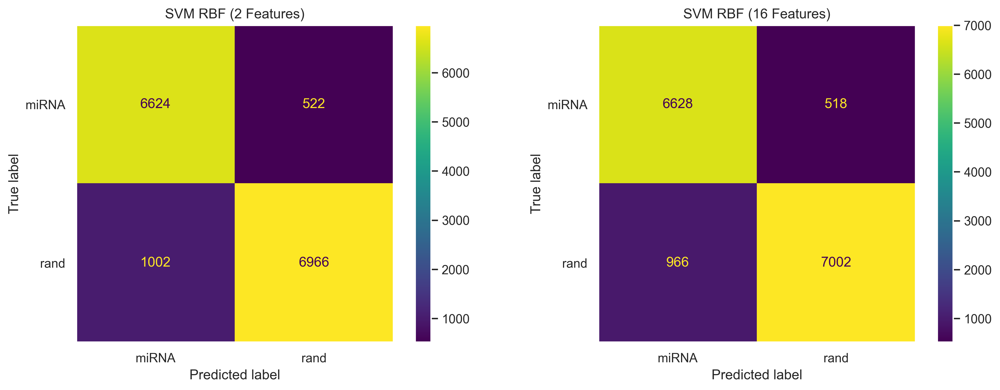

In [31]:
from sklearn.svm import SVC

save_path = f'AnimalData/SVM/split_0'
colors = ['#F3A230', 'salmon']

# Best classifier
n_features = [2, 16]
best_estimator = SVC(
                     C            = 100,
                     gamma        = 1.0,
                     kernel       = 'rbf',
                     random_state = SEED
                    )

report, conf_matrix = [0]*2, [0]*2
# Evaluate on normalized data
report[0], conf_matrix[0], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val_std, y_train_val], 
                                test_data  = [X_test_std, y_test],
                                n_features = n_features[0],
                                save_path  = save_path,
                                model_name = "SVM RBF (2 Features)"
                            )
# Evaluate on normalized data
report[1], conf_matrix[1], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val_std, y_train_val], 
                                test_data  = [X_test_std, y_test],
                                n_features = n_features[1],
                                save_path  = save_path,
                                model_name = "SVM RBF (16 Features)"
                            )
# Plot confusion matrix
fig, ax = plt.subplots(1, 2, figsize=(15,5), dpi=300)
ax[0].set_title("SVM RBF (2 Features)")
ax[1].set_title("SVM RBF (16 Features)")
conf_matrix[0].plot(ax=ax[0])
conf_matrix[1].plot(ax=ax[1])
ax[0].grid(False)
ax[1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color=colors[0], axis=0)

Indeed we have better results with more features, so the best number of features is 16 actually.

---
# 3. Neural Networks

### 3.1. Features and hyperparameters selection

In [18]:
from sklearn.neural_network import MLPClassifier

# Classifier
estimator = MLPClassifier(early_stopping=True, random_state=SEED)

# Hyperparameters to evaluate
params_grid = { 'hidden_layer_sizes' : [(10), (20), (10, 10), (20, 20)],
                'learning_rate_init' : [0.001, 0.01, 0.1],
                'solver'             : ['sgd', 'adam']
              }

In [19]:
%%time
save_path = f'AnimalData/MLP'

# Search best configurations
mlp_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
mlp_splits_results = save_splits_results(mlp_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 18
 > F1 Score: 0.9030297915435902
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'learning_rate_init': 0.01, 'solver': 'adam'}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8940555271674331
 > Hyperparameters: {'hidden_layer_sizes': (10, 10), 'learning_rate_init': 0.1, 'solver': 'adam'}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 25
 > F1 Score: 0.8985459352280238
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'learning_rate_init': 0.1, 'solver': 'adam'}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 9
 > F1 Score: 0.8989163562478836
 > Hyperparameters: {'hidden_layer_sizes': 20, 'learnin

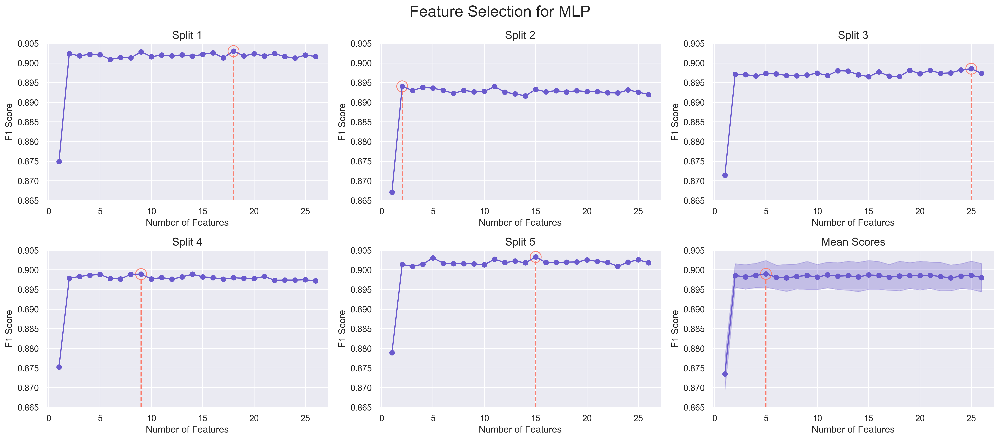

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/MLP'
mlp_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(mlp_splits_results, "MLP", y_lims=[0.865, 0.905])

### Selection results summary

,n_features,hidden_layer_sizes,learning_rate_init,solver,test_score,fit_time,score_time
data,,,,,,,
Split 1,18,"(20, 20)",0.010000,adam,0.903030,4.318627,0.020841
Split 2,2,"(10, 10)",0.100000,adam,0.894056,2.236278,0.000000
Split 3,25,"(20, 20)",0.100000,adam,0.898546,2.245026,0.021260
Split 4,9,20,0.010000,adam,0.898916,3.531593,0.017034
Split 5,15,"(20, 20)",0.100000,adam,0.903296,2.867081,0.005000


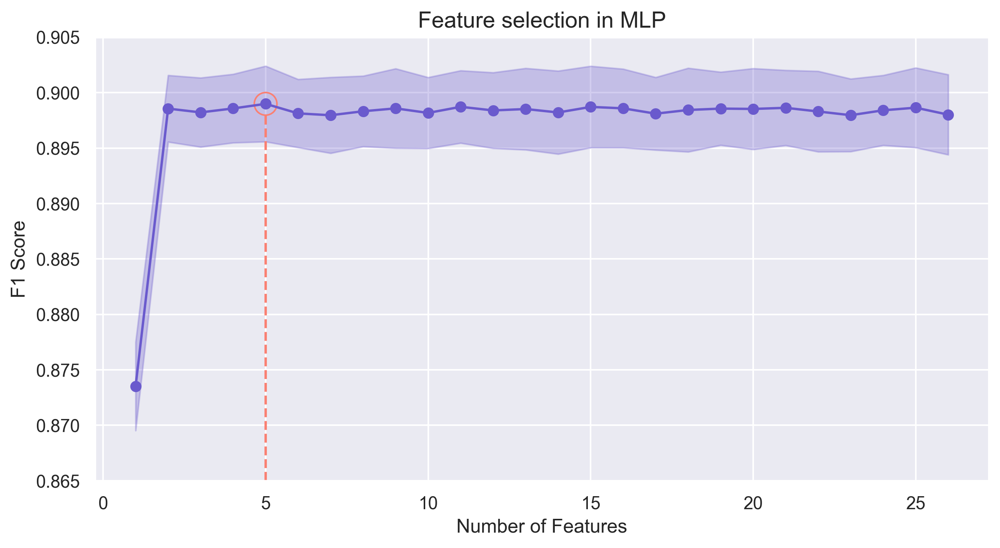

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/MLP'

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in MLP", std=True, y_lims=[0.865, 0.905])

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path)

We can select the best configuration as the two layers of 20 neurons and adam solver, but the learning rate is not clear between 0.1 and 0.01.

It's looks like with 5 features got the best results, but maybe is not really enough, like the previous case with SVM.

In [24]:
splits_results = pd.read_csv('AnimalData/MLP/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']
split_result.sort_values(by='score', ascending=False).reset_index(drop=True).head(5)

,n_features,score,std_scores
0,5,0.898986,0.003412
1,11,0.898718,0.003268
2,15,0.898710,0.003678
3,25,0.898640,0.003598
4,21,0.898627,0.003390


With 11 and 15 features the results are similar, so let's compare both to see if more features are needed.

## 3.2. Evaluation in test data

Evaluation with 5 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
MLP (learning rate = 0.1),0.897645,0.850332,0.950882,0.897800,1.749809,0.004000
MLP (learning rate = 0.01),0.898240,0.856925,0.942065,0.897480,1.570292,0.003999


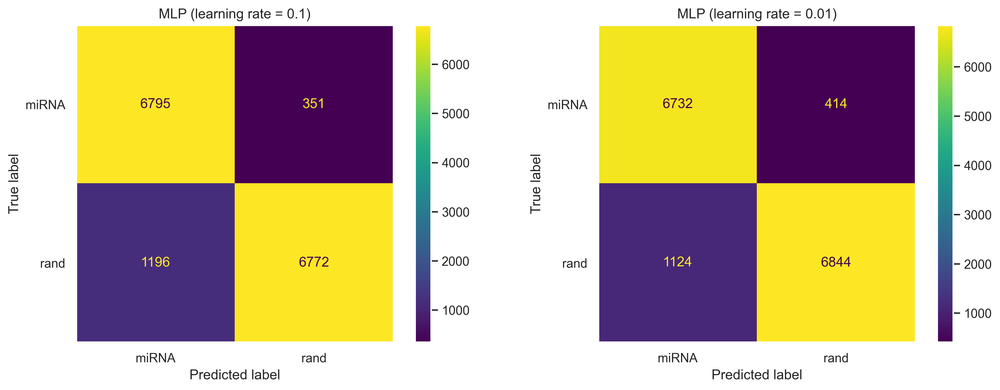

In [46]:
from sklearn.neural_network import MLPClassifier

save_path = f'PlantsData/MLP/split_0'
 
# Best classifiers
n_features = 5

best_estimators = [0]*2
best_estimators[0] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.1,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
best_estimators[1] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.01,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["MLP (learning rate = 0.1)", "MLP (learning rate = 0.01)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color='slateblue', axis=0)

Evaluation with 11 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
MLP (learning rate = 0.1),0.899629,0.872732,0.922194,0.896782,3.623919,0.006434
MLP (learning rate = 0.01),0.900357,0.859877,0.942905,0.899479,3.285076,0.007568


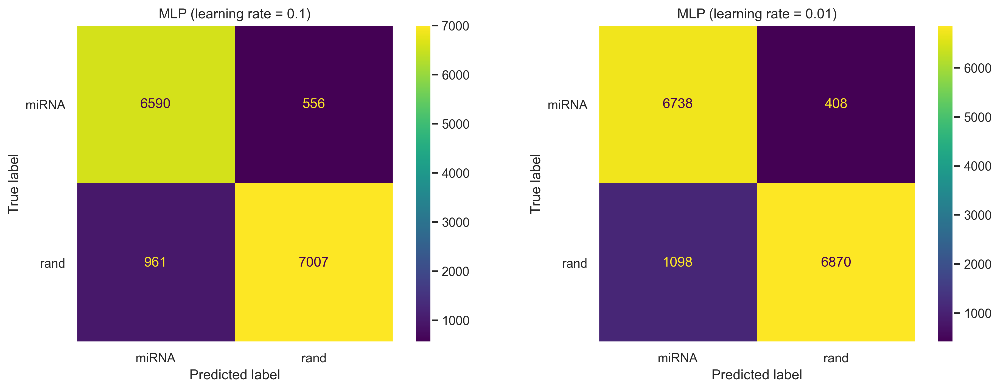

In [25]:
from sklearn.neural_network import MLPClassifier

save_path = f'PlantsData/MLP/split_0'
 
# Best classifiers
n_features = 11

best_estimators = [0]*2
best_estimators[0] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.1,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
best_estimators[1] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.01,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["MLP (learning rate = 0.1)", "MLP (learning rate = 0.01)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color='slateblue', axis=0)

Evaluation with 15 features

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
MLP (learning rate = 0.1),0.898174,0.849869,0.952981,0.898476,3.444577,0.008079
MLP (learning rate = 0.01),0.897843,0.852416,0.948083,0.897708,3.074248,0.004205


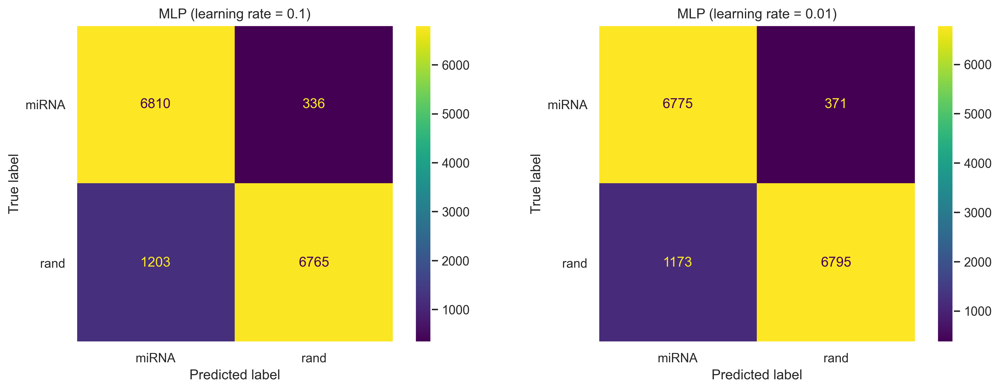

In [21]:
from sklearn.neural_network import MLPClassifier

save_path = f'PlantsData/MLP/split_0'
 
# Best classifiers
n_features = 15

best_estimators = [0]*2
best_estimators[0] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.1,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
best_estimators[1] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.01,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["MLP (learning rate = 0.1)", "MLP (learning rate = 0.01)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color='slateblue', axis=0)

The best number of features results in 11 features with a learning rate of 0.01.

---
# 4. K-Nearest Neighbors

### 4.1. Features and hyperparameters selection

In [58]:
from sklearn.neighbors import KNeighborsClassifier

# Classifier
estimator = KNeighborsClassifier()

# Hyperparameters to evaluate
params_grid = {'n_neighbors' : [5, 10, 15, 20, 25, 30],
               'p': [1, 2]} # Manhattan and euclidean distance metrics

# Colors to classifier results
colors = ['lightseagreen', 'salmon']

Some parameter settings result in division by zero when calculating F1 Score, this is because the recall and precision of the classifier with these settings is really bad, in fact both are zero, and this means that TP = 0, so the classifier is useless because cannot predict any correct positive result. So we ignore invalid result warnings, because this results will be discarded anyway.

In [59]:
%%time
save_path = f'AnimalData/KNN'

# Search best configurations
knn_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
knn_splits_results = save_splits_results(knn_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8997042670046471
 > Hyperparameters: {'n_neighbors': 25, 'p': 2}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8902001026167266
 > Hyperparameters: {'n_neighbors': 25, 'p': 2}

Split 3:


c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [       nan 0.82243478        nan 0.8149084  0.81469844 0.81930455
 0.80657848 0.81102362 0.81316945 0.81753367 0.80561015 0.81012885]
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:984: RuntimeWarning: invalid value encountered in cast
  results["rank_%s" % key_name] = np.asarray(


=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.8949856491642748
 > Hyperparameters: {'n_neighbors': 25, 'p': 2}

Split 4:


c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [       nan 0.82095537 0.79809541 0.81057989        nan 0.81998414
 0.79960192 0.81094258 0.80352376 0.81448044        nan 0.8067015 ]
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:984: RuntimeWarning: invalid value encountered in cast
  results["rank_%s" % key_name] = np.asarray(
c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [       nan 0.82057541 0.79956088 0.81133618 0.81054307 0.82131551
 0.80115848 0.81337298 0.80491278 0.81591775 0.79916735 0.80894419]
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:984: RuntimeWarning: invalid value encountered in cast
  results["rank_%s" % key_name] = np.asarray(


=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8952478283086357
 > Hyperparameters: {'n_neighbors': 30, 'p': 2}

Split 5:


c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [0.82148775 0.82815771 0.81795918 0.82261279 0.82573491 0.82971046
 0.81782178 0.82229213 0.82119791        nan 0.81455462 0.82204301]
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\model_selection\_search.py:984: RuntimeWarning: invalid value encountered in cast
  results["rank_%s" % key_name] = np.asarray(


=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8978034093800356
 > Hyperparameters: {'n_neighbors': 25, 'p': 2}
CPU times: total: 46.3 s
Wall time: 3h 1min 8s


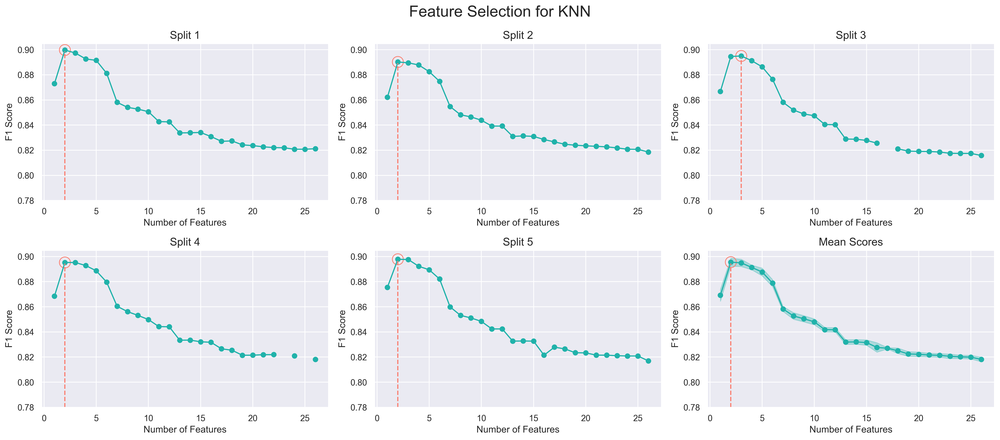

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/KNN'
mlp_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(mlp_splits_results, "KNN", y_lims=[0.78, 0.905], colors=colors)

### Selection results summary

,n_features,n_neighbors,p,test_score,fit_time,score_time
data,,,,,,
Split 1,2,25,2,0.899704,0.049643,0.292068
Split 2,2,25,2,0.890200,0.074712,0.273451
Split 3,3,25,2,0.894986,0.063762,0.369225
Split 4,2,30,2,0.895248,0.047989,0.298256
Split 5,2,25,2,0.897803,0.053601,0.266602


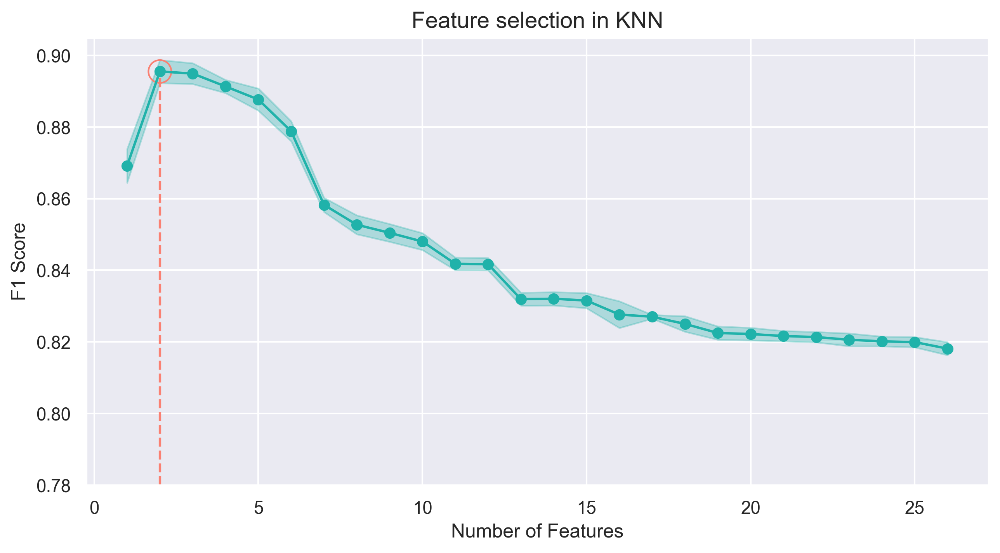

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/KNN'
colors = ['lightseagreen', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in KNN", std=True, y_lims=[0.78, 0.905], colors=colors)

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path, colors=colors)

For a better decision, the performance in each number of neighbors by distance metric with 2 and 5 features is graphed below.

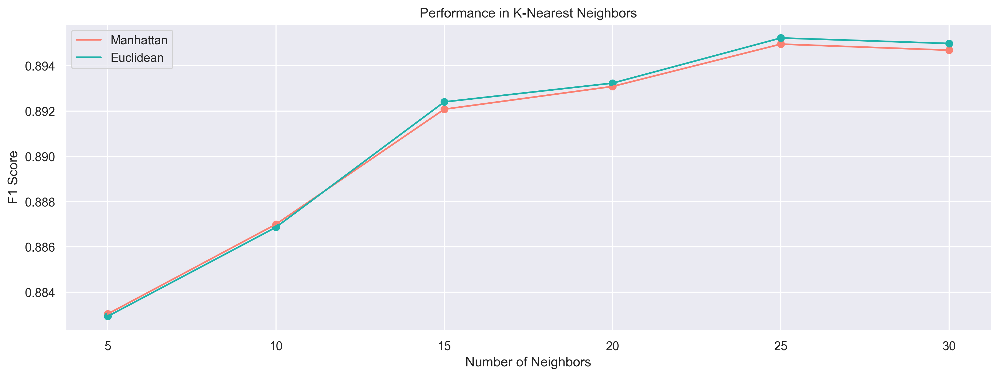

In [50]:
# Compare number of neighbors in best number of features
n_features = 2
save_path = f'AnimalData/KNN'
colors = ['lightseagreen', 'salmon']

scores_1, scores_2 = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features}_features.csv")
    scores_1.append(df[df['param_p'] == 1]['mean_test_score'])
    scores_2.append(df[df['param_p'] == 2]['mean_test_score'])
    n_neighbors = df[df['param_p'] == 1]['param_n_neighbors']

# Plot the comparation
fig, ax = plt.subplots(figsize=(15,5), dpi=300)
ax.set_title("Performance in K-Nearest Neighbors")
ax.plot(n_neighbors, np.mean(scores_1, axis=0), color=colors[1], label="Manhattan")
ax.scatter(n_neighbors, np.mean(scores_1, axis=0), color=colors[1])
ax.plot(n_neighbors, np.mean(scores_2, axis=0), color=colors[0], label="Euclidean")
ax.scatter(n_neighbors, np.mean(scores_2, axis=0), color=colors[0])
ax.set_ylabel("F1 Score")
ax.set_xlabel("Number of Neighbors")
ax.legend()

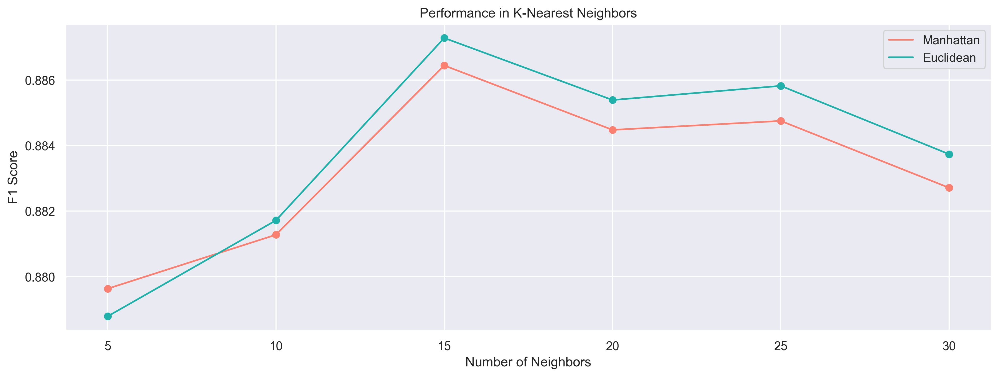

In [28]:
# Compare number of neighbors in best number of features
n_features = 5
save_path = f'AnimalData/KNN'
colors = ['lightseagreen', 'salmon']

scores_1, scores_2 = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features}_features.csv")
    scores_1.append(df[df['param_p'] == 1]['mean_test_score'])
    scores_2.append(df[df['param_p'] == 2]['mean_test_score'])
    n_neighbors = df[df['param_p'] == 1]['param_n_neighbors']

# Plot the comparation
fig, ax = plt.subplots(figsize=(15,5), dpi=300)
ax.set_title("Performance in K-Nearest Neighbors")
ax.plot(n_neighbors, np.mean(scores_1, axis=0), color=colors[1], label="Manhattan")
ax.scatter(n_neighbors, np.mean(scores_1, axis=0), color=colors[1])
ax.plot(n_neighbors, np.mean(scores_2, axis=0), color=colors[0], label="Euclidean")
ax.scatter(n_neighbors, np.mean(scores_2, axis=0), color=colors[0])
ax.set_ylabel("F1 Score")
ax.set_xlabel("Number of Neighbors")
ax.legend()

On both cases the best distance metric is euclidean distance, but with 5 features have better results with 15 neighbors.

## 4.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
KNN (Manhattan distance),0.895924,0.864487,0.924853,0.893652,0.037000,0.249999
KNN (Euclidean distance),0.896586,0.865141,0.925553,0.894328,0.037000,0.250056


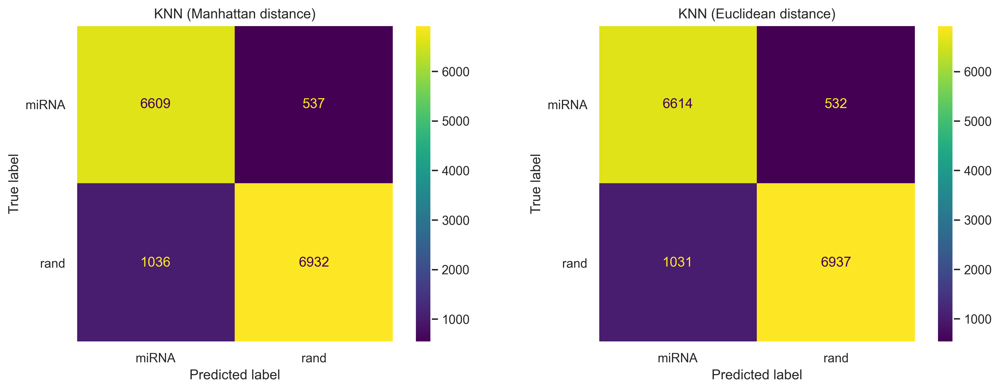

In [51]:
from sklearn.neighbors import KNeighborsClassifier
import warnings

save_path = f'AnimalData/KNN/split_0'
colors = ['lightseagreen', 'salmon']

# Best classifiers
n_features = 2

best_estimators = [0]*2
best_estimators[0] = KNeighborsClassifier(n_neighbors=25, p=1)
best_estimators[1] = KNeighborsClassifier(n_neighbors=25, p=2)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["KNN (Manhattan distance)", "KNN (Euclidean distance)"]

# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(len(best_estimators)):
        report[i], conf_matrix[i], _ = estimator_evaluation(
                                        estimator  = best_estimators[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features,
                                        save_path  = save_path,
                                        model_name = model_names[i]
                                    )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
KNN (Manhattan distance),0.892285,0.862454,0.918696,0.889687,0.025675,0.548452
KNN (Euclidean distance),0.892087,0.863546,0.916597,0.889281,0.023646,0.440700


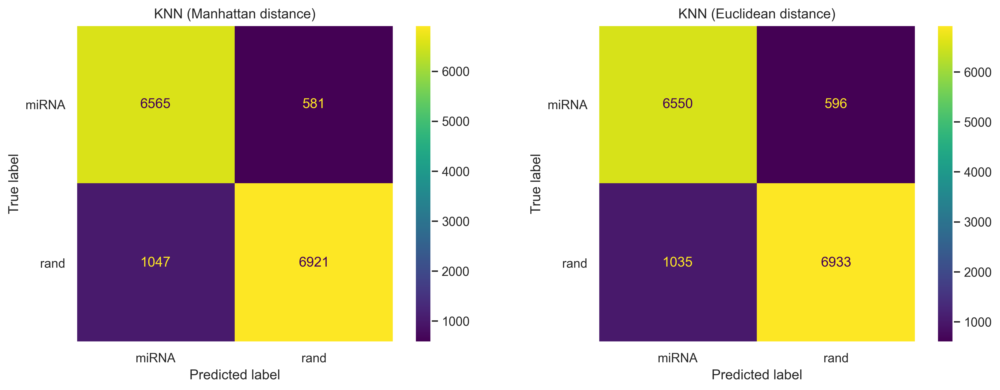

In [29]:
from sklearn.neighbors import KNeighborsClassifier
import warnings

save_path = f'AnimalData/KNN/split_0'
colors = ['lightseagreen', 'salmon']

# Best classifiers
n_features = 5

best_estimators = [0]*2
best_estimators[0] = KNeighborsClassifier(n_neighbors=25, p=1)
best_estimators[1] = KNeighborsClassifier(n_neighbors=25, p=2)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["KNN (Manhattan distance)", "KNN (Euclidean distance)"]

# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(len(best_estimators)):
        report[i], conf_matrix[i], _ = estimator_evaluation(
                                        estimator  = best_estimators[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features,
                                        save_path  = save_path,
                                        model_name = model_names[i]
                                    )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(15,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

Both are very close, but with 2 features we have the best results.

---
# 5. Naive Bayes

## 5.1. Features and hyperparameters selection

In [22]:
from sklearn.naive_bayes import MultinomialNB

# Classifier
estimator = MultinomialNB()

# Hyperparameters to evaluate
params_grid = {}

# Colors to classifier results
colors = ['#5065DE', 'salmon']

#### Non-normalized data

In [23]:
%%time
save_path = f'AnimalData/NaiveBayes'

# Search best configurations
nb_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
nb_splits_results = save_splits_results(nb_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8593511126210294
 > Hyperparameters: {}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8479070976687755
 > Hyperparameters: {}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8570206212030461
 > Hyperparameters: {}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8581718401646372
 > Hyperparameters: {}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.8585901948999742
 > Hyperparameters: {}
CPU times: total: 27.5 s
Wall time: 47.5 s


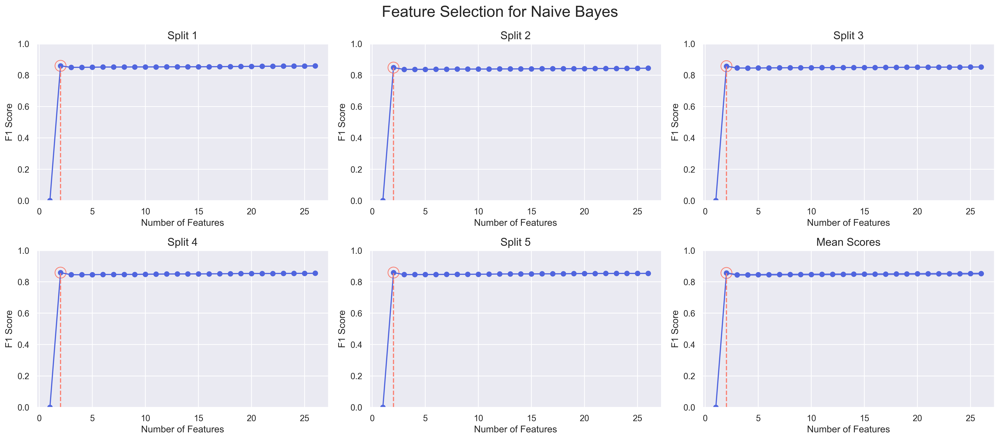

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/NaiveBayes'
nb_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(nb_splits_results, "Naive Bayes", colors=colors)

#### On Normalized data

In [26]:
%%time
save_path = f'AnimalData/NaiveBayes/Normalized'

# Search best configurations
nb_std_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
nb_std_splits_results = save_splits_results(nb_std_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.6872466479575928
 > Hyperparameters: {}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 21
 > F1 Score: 0.6878582595101617
 > Hyperparameters: {}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 15
 > F1 Score: 0.6767434587720214
 > Hyperparameters: {}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.6840676550428065
 > Hyperparameters: {}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.685672514619883
 > Hyperparameters: {}
CPU times: total: 28 s
Wall time: 42.1 s


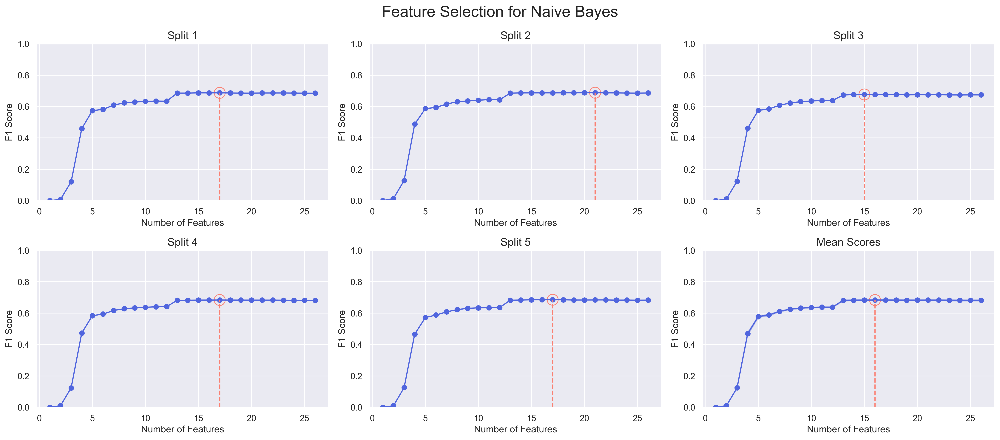

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/NaiveBayes/Normalized'
nb_std_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(nb_std_splits_results, "Naive Bayes", colors=colors)

### Non-Normalized vs Normalized data

,n_features,test_score,fit_time,score_time,n_features (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,
Split 1,2,0.859351,0.005000,0.003000,17,0.687247,0.010003,0.003999
Split 2,2,0.847907,0.005997,0.002000,21,0.687858,0.011004,0.002995
Split 3,2,0.857021,0.005998,0.002000,15,0.676743,0.009343,0.003000
Split 4,2,0.858172,0.006000,0.003000,17,0.684068,0.010001,0.003000
Split 5,2,0.858590,0.005000,0.003000,17,0.685673,0.010024,0.002988


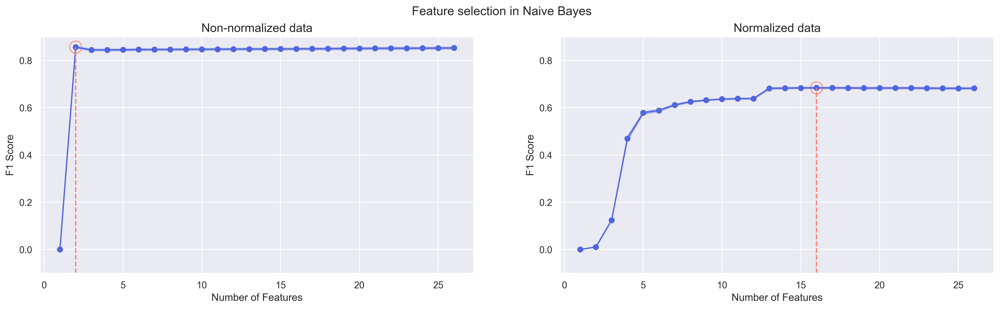

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'AnimalData/NaiveBayes'
colors = ['#5065DE', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Naive Bayes")
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[-0.1, 0.9], colors=colors)
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[-0.1, 0.9], colors=colors)

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]

compare_Results = pd.concat([results, std_results], axis=1)
compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[0], axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color=colors[0], axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color=colors[1], axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[1], axis=0)

## 5.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Naive Bayes (Non-normalized data),0.861122,0.838135,0.875315,0.856321,0.013476,0.001348
Naive Bayes (Normalized data),0.744409,0.831549,0.576127,0.680665,0.069820,0.003034


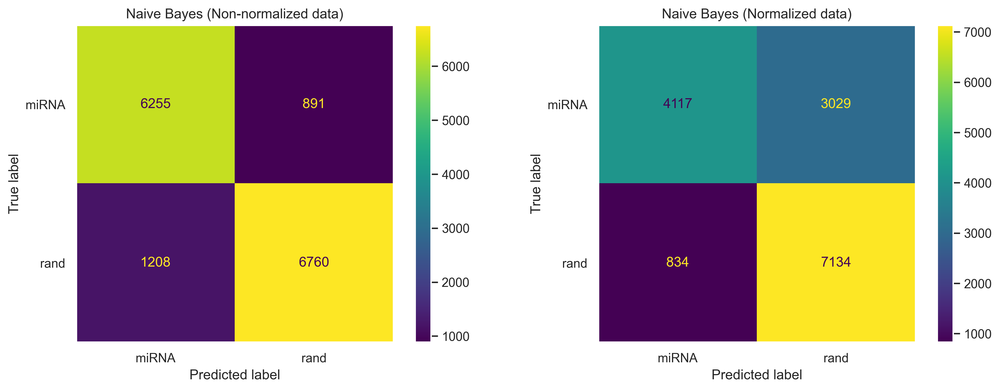

In [27]:
from sklearn.naive_bayes import MultinomialNB

save_path = f'AnimalData/NaiveBayes/split_0'
colors = ['#5065DE', 'salmon']

# Best classifier
n_features = [2, 16]
best_estimator = MultinomialNB()

report, conf_matrix = [0]*2, [0]*2
# Evaluate on no normalized data
report[0], conf_matrix[0], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val, y_train_val], 
                                test_data  = [X_test, y_test],
                                n_features = n_features[0],
                                save_path  = save_path,
                                model_name = "Naive Bayes (Non-normalized data)"
                            )
# Evaluate on normalized data
report[1], conf_matrix[1], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val_std, y_train_val], 
                                test_data  = [X_test_std, y_test],
                                n_features = n_features[1],
                                save_path  = save_path,
                                model_name = "Naive Bayes (Normalized data)"
                            )
# Plot confusion matrix
fig, ax = plt.subplots(1, 2, figsize=(15,5), dpi=300)
ax[0].set_title("Naive Bayes (Non-normalized data)")
ax[1].set_title("Naive Bayes (Normalized data)")
conf_matrix[0].plot(ax=ax[0])
conf_matrix[1].plot(ax=ax[1])
ax[0].grid(False)
ax[1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color=colors[0], axis=0)

---
---
# Classifiers Comparation Results

### Feature selection plots

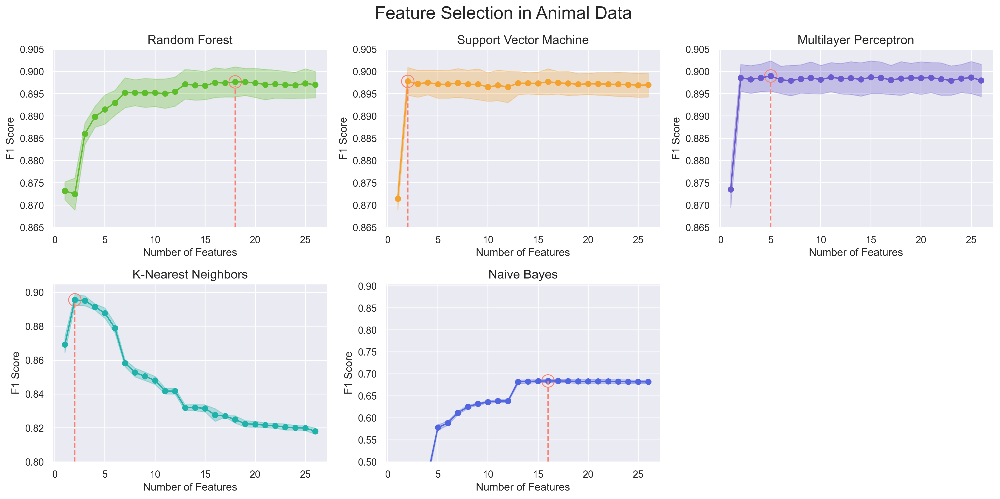

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
sns.set(color_codes=True)

model_files = ['RandomForest/Normalized', 'SVM', 'MLP', 'KNN', 'NaiveBayes/Normalized']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

colors = ['#5EBD2A', '#F3A230', 'slateblue', 'lightseagreen', '#5065DE']
y_lims = [[0.865, 0.905]]*3+[[0.8, 0.905]]+[[0.5, 0.905]]

fig, ax = plt.subplots(2, 3, figsize=(16, 8), dpi=300)
fig.suptitle(f"Feature Selection in Animal Data", fontsize= 20)
for i in range(len(model_files)):
    model_results = pd.read_csv(f'AnimalData/{model_files[i]}/splits_results_summary.csv')
    model_results = model_results[['n_features', 'mean_scores', 'std_scores']]
    model_results.columns = ['n_features', 'score', 'std_scores']
    axes = [0,i] if i < 3 else [1, i-3]
    plot_rfeh_results(model_results, ax[axes[0], axes[1]], f"{model_names[i]}", 
                      std=True, colors=[colors[i], 'salmon'], y_lims=y_lims[i])
    fig.tight_layout()
ax[-1, -1].set_visible(False)

### Evaluation in test data

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC

save_path = "AnimalData"
model_files = ['RandomForest', 'SVM', 'MLP', 'KNN', 'NaiveBayes']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

n_features, best_estimator = [0]*5, [0]*5
report, conf_matrix, y_preds = [0]*5, [0]*5, [0]*5

# Best hyperparameters ------------------------------------------------------------------
params_list = ['n_estimators: 1000, criterion: entropy',
               'kernel: rbf, C: 100, gamma: 1',
               'hidden_layer_sizes = (20, 20), learning_rate_init: 0.01, solver: adam',
               'n_neighbors: 25, p: 2',
               '---'
               ]
# Best classifiers ----------------------------------------------------------------------
n_features[0] = 18
best_estimator[0] = RandomForestClassifier(
                                        n_estimators=1000, 
                                        criterion='entropy', 
                                        random_state = SEED
                                        )
n_features[1] = 16
best_estimator[1] = SVC(
                     C            = 100,
                     gamma        = 1.0,
                     kernel       = 'rbf',
                     random_state = SEED
                    )
n_features[2] = 11
best_estimator[2] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.01,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
n_features[3] = 2
best_estimator[3] = KNeighborsClassifier(n_neighbors = 25, p = 2)

n_features[4] = 16
best_estimator[4] = MultinomialNB()

,Parameters,No.Features,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Random Forest (Animal Data),"n_estimators: 1000, criterion: entropy",18,0.897909,0.863312,0.931570,0.896143,93.020299,2.984041
Support Vector Machine (Animal Data),"kernel: rbf, C: 100, gamma: 1",16,0.901813,0.872794,0.927512,0.899322,64.220499,22.257535
Multilayer Perceptron (Animal Data),"hidden_layer_sizes = (20, 20), learning_rate_init: 0.01, solver: adam",11,0.900556,0.863455,0.938007,0.899188,5.291532,0.008604
K-Nearest Neighbors (Animal Data),"n_neighbors: 25, p: 2",2,0.896983,0.866012,0.925273,0.894662,0.031671,0.343541
Naive Bayes (Animal Data),---,16,0.744409,0.831549,0.576127,0.680665,0.013456,0.001116


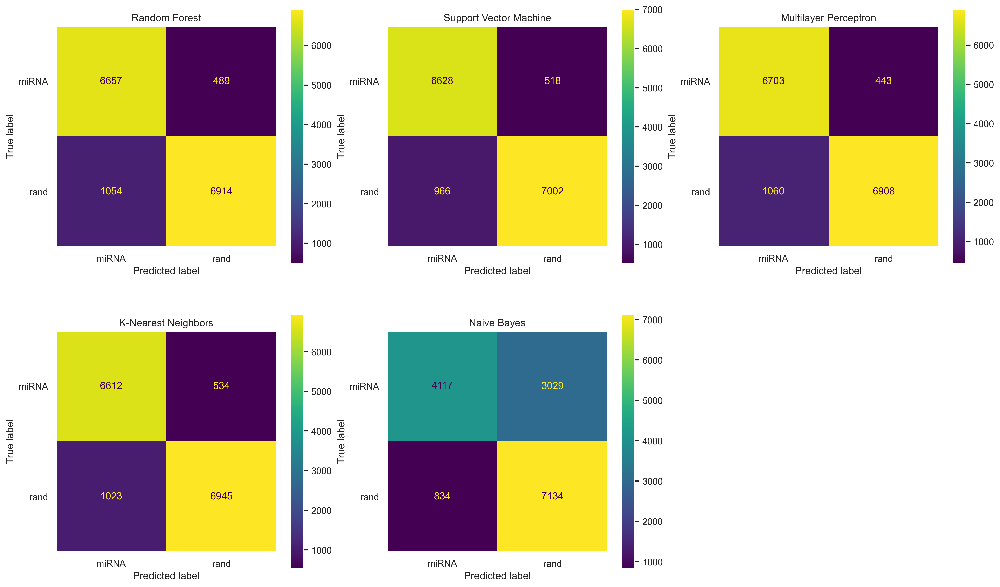

In [33]:
# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(5):
        report[i], conf_matrix[i], y_preds[i] = estimator_evaluation(
                                        estimator  = best_estimator[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features[i],
                                        save_path  = f"{save_path}/{model_files[i]}/split_0",
                                        model_name = model_names[i]+' (Animal Data)'
                                    )
predict_df = pd.DataFrame(data=np.array(y_preds).T,columns=model_names)
predict_df.to_csv(f"{save_path}/predictions.csv")

# Summary results
fig, ax = plt.subplots(2, 3, figsize=(20,12), dpi=300)
results_summary = pd.DataFrame()
row = 0
for i in range(5):
    if i == 3: row = 1
    ax[row, i - row*3].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[row, i- row*3])
    ax[row, i - row*3].grid(False)
    results_summary = pd.concat([results_summary, report[i]], axis=0)

ax[-1, -1].axis('off')

# Add parameters in results
results_summary.insert(0, 'Parameters', params_list)
results_summary.insert(1, 'No.Features', n_features)
results_summary.to_csv(f"{save_path}/results_summary.csv")
results_summary.style.highlight_max(color='salmon', subset=results_summary.columns[2:])\
                     .highlight_min(color='slateblue', subset=results_summary.columns[2:])

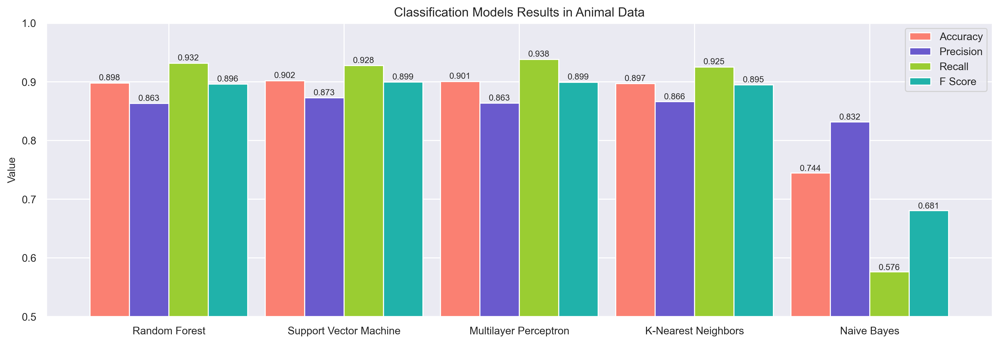

In [34]:
# Plot metrics results
results_summary = pd.read_csv("AnimalData/results_summary.csv")

colors = ['salmon', 'slateblue', 'yellowgreen', 'lightseagreen']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

results_plot = results_summary.filter(regex = '(Accuracy|Precision|Recall|F1 Score)')
ax = results_plot.plot(kind='bar', figsize=(16, 5), width=0.9, color=colors, fontsize=10)
ax.set_title('Classification Models Results in Animal Data', fontsize=12)
ax.legend(['Accuracy', 'Precision', 'Recall', 'F Score'], bbox_to_anchor=[1, 1], fontsize=10)
ax.set_xticklabels(model_names, fontsize=10, rotation=0)
ax.set_ylabel('Value', fontsize=10)
ax.set_ylim(0.5, 1)
ax.figure.dpi = 300
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),3)), (p.get_x() + 0.05, p.get_height() * 1.005), fontsize=8)

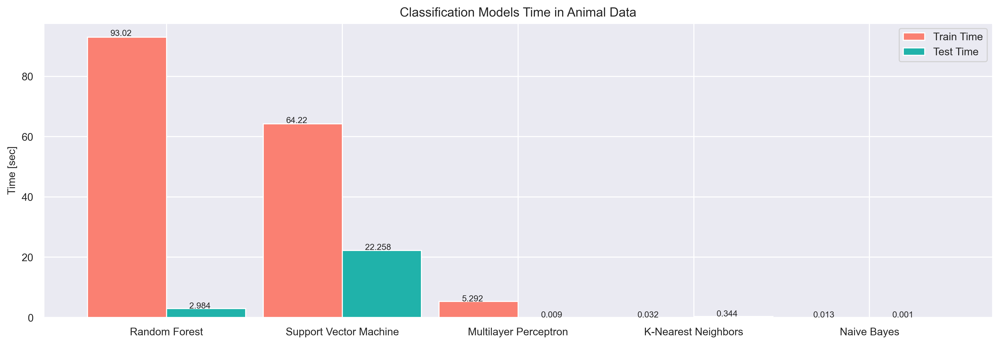

In [35]:
# Plot time results
results_summary = pd.read_csv("AnimalData/results_summary.csv")

colors = ['salmon','lightseagreen']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

results_plot = results_summary.filter(regex = '(.Time)')
ax = results_plot.plot(kind='bar', figsize=(16, 5), width=0.9, color=colors, fontsize=10)
ax.set_title('Classification Models Time in Animal Data', fontsize=12)
ax.legend(['Train Time', 'Test Time'], bbox_to_anchor=[1, 1], fontsize=10)
ax.set_xticklabels(model_names, fontsize=10, rotation=0)
ax.set_ylabel('Time [sec]', fontsize=10)
ax.figure.dpi = 300
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),3)), (p.get_x() + 0.13, p.get_height() * 1.005), fontsize=8)